In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install_from_url("https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh")

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:11
🔁 Restarting kernel...


In [ ]:
# 2. See the Python version and the pins file
!python --version
!cat /usr/local/conda-meta/pinned

Python 3.12.11
python 3.11.*
python_abi 3.11.* *cp311*
cuda-version 12.*


In [ ]:
# 3. Delete the pins file that locks Python
!rm /usr/local/conda-meta/pinned

**Review on 09/24/2025**

Note that the Python version is 3.11.11, but conda colab installed a "pin" for version 3.12. This caused an incompatibility. It seems that colab will change to version 3.12 soon and this will solve the problem. But before that, let's force the condacolab "pin" to 3.11 by installing condacolab directly from the above release.

In [ ]:
!mamba install -c conda-forge python=3.11 pygmt gsw


[+] 0.0s
[+] 0.1s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  [+] 0.2s
conda-forge/linux-64   2%
conda-forge/noarch    ⣾  [+] 0.3s
conda-forge/linux-64  21%
conda-forge/noarch     1%[+] 0.4s
conda-forge/linux-64  30%
conda-forge/noarch    26%[+] 0.5s
conda-forge/linux-64  41%
conda-forge/noarch    50%[+] 0.6s
conda-forge/linux-64  43%
conda-forge/noarch    53%[+] 0.7s
conda-forge/linux-64  48%
conda-forge/noarch    64%[+] 0.8s
conda-forge/linux-64  52%
conda-forge/noarch    73%[+] 0.9s
conda-forge/linux-64  54%
conda-forge/noarch    77%[+] 1.0s
conda-forge/linux-64  55%
conda-forge/noarch    78%[+] 1.1s
conda-forge/linux-64  63%
conda-forge/noarch    96%[+] 1.2s
conda-forge/linux-64  65%
conda-forge/noarch   100%[+] 1.3s
conda-forge/linux-64  65%
conda-forge/noarch   100%conda-forge/noarch                                
[+] 1.4s
conda-forge/linux-64  68%[+] 1.5s
conda-forge/linux-64  80%[+] 1.6s
conda-forge/linux-64  80%[+] 1.7s
conda-forge/linux-64  89%[+] 1.8s
conda-forge/lin

In [ ]:
import pygmt
import gsw

In [ ]:
#import pygmt
pygmt.show_versions()

PyGMT information:
  version: v0.16.0
System information:
  python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
  executable: /usr/bin/python3.real
  machine: Linux-6.6.97+-x86_64-with-glibc2.35
Dependency information:
  numpy: 2.3.3
  pandas: 2.3.3
  xarray: 2025.9.0
  packaging: 25.0
  contextily: None
  geopandas: 1.0.1
  IPython: 7.34.0
  pyarrow: 18.1.0
  rioxarray: None
  gdal: 3.8.4
  ghostscript: 10.06.0
GMT library information:
  version: 6.5.0
  padding: 2
  share dir: /usr/local/share/gmt
  plugin dir: /usr/local/lib/gmt/plugins
  library path: /usr/local/lib/libgmt.so
  cores: 2
  grid layout: rows
  image layout: 
  binary version: 6.5.0


Make sure to import the necessary libraries after all installations are complete.

In [ ]:
# note that if you need to, you have to adapt the location
#base = '/content/drive/MyDrive/05_Publicações/2024 Schimidel Artigo_AIA/Notebooks_e_Arquivos'

# Step 1 - Data Grid and Isopycnals

Skip this step after you have calculated the TSZ grid and Neutral Density.

In [ ]:
#%%capture
# download WOA data
!wget https://www.ncei.noaa.gov/thredds-ocean/fileServer/ncei/woa/temperature/decav81B0/1.00/woa18_decav81B0_t00_01.nc
!wget https://www.ncei.noaa.gov/thredds-ocean/fileServer/ncei/woa/salinity/decav81B0/1.00/woa18_decav81B0_s00_01.nc
#!mv woa*.nc "$base/."

--2025-10-02 16:45:02--  https://www.ncei.noaa.gov/thredds-ocean/fileServer/ncei/woa/temperature/decav81B0/1.00/woa18_decav81B0_t00_01.nc
Resolving www.ncei.noaa.gov (www.ncei.noaa.gov)... 205.167.25.168, 205.167.25.178, 205.167.25.177, ...
Connecting to www.ncei.noaa.gov (www.ncei.noaa.gov)|205.167.25.168|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 185103667 (177M) [application/x-netcdf]
Saving to: ‘woa18_decav81B0_t00_01.nc’

woa18_decav81B0_t00 100%[===================>] 176.53M  10.6MB/s    in 19s     

2025-10-02 16:45:21 (9.36 MB/s) - ‘woa18_decav81B0_t00_01.nc’ saved [185103667/185103667]

--2025-10-02 16:45:21--  https://www.ncei.noaa.gov/thredds-ocean/fileServer/ncei/woa/salinity/decav81B0/1.00/woa18_decav81B0_s00_01.nc
Resolving www.ncei.noaa.gov (www.ncei.noaa.gov)... 205.167.25.168, 205.167.25.178, 205.167.25.177, ...
Connecting to www.ncei.noaa.gov (www.ncei.noaa.gov)|205.167.25.168|:443... connected.
HTTP request sent, awaiting response... 200 

In [ ]:
# calculate the neutral density field
import xarray as xr
import gsw

# Temperature and salinity data from WOA
temp = xr.open_dataset("woa18_decav81B0_t00_01.nc", decode_times=False)
sal = xr.open_dataset("woa18_decav81B0_s00_01.nc", decode_times=False)

press = gsw.p_from_z(-temp.depth, 0)
sal = gsw.SA_from_SP(sal.s_an, press, sal.lon, sal.lat)
temp = gsw.CT_from_t(sal, temp.t_an, press)

In [ ]:
!pip install neutralocean fiona geopandas regionmask

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.7/27.7 MB 48.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 93.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 76.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 120.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 83.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 126.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 62.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 65.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 68.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.6/806.6 kB 30.8 

In [ ]:
import neutralocean as no

# Dados de entrada
T = temp  # Temperatura
S = sal   # Salinidade
t, nk, ni, nj = S.shape
Z = S.depth.values

# Constantes físicas (você pode ajustar se necessário)
grav = 9.81
rho_c = 1035.0

# Carregar a equação de estado e suas derivadas
eos = no.load_eos("jmd95", "", grav, rho_c)
eos_s_t = no.load_eos("jmd95", "_s_t", grav, rho_c)

# Construir o grid (ajuste se necessário)
grid = no.grid.rectilinear.build_grid(
    (ni, nj),
    (False, True))  # ou (False, False) se não tiver periodicidade zonal

# Configurações padrão para o cálculo da superfície isopicnal
opts = dict(
    grid=grid,
    interp="linear",          # ou "pchip"
    vert_dim="depth",         # nome da dimensão vertical
    eos=eos,
    eos_s_t=eos_s_t,
    ref=0.0,
    isoval=1027.2             # valor de sigma_0 da isopicna
)

# Cálculo da superfície de densidade potencial
s, t, z, d = no.potential_surf(S, T, Z, **opts)

potential done |       32417 wet casts | RMS(ϵ) = 1.27916880e-03  | 7.158 sec


In [ ]:
# concatenate all
ds = xr.Dataset(
    {
        "salinity": s,
        "temperature": t,
        "depth": z
    }
)

# Add global attributes (optional)
ds.attrs["title"] = "1017.2 sigma s --> Salinity associated with it, t --> Temperature associated with it, z --> Depth associated with it"
ds.attrs["source"] = "GSW Calculated data"
ds.attrs["reference_density"] = "1027.2"

# Save the Dataset to a NetCDF file
#ds.to_netcdf(base+"/sigma1027_2.nc", format="NETCDF4")
ds.to_netcdf("/sigma1027_2.nc", format="NETCDF4")

In [ ]:
# Download KML regions
!gdown 1zSbiPWLf9eGuL_t0PBw59drabnKcK4lZ
!gdown 1VUhZACp7S4eibMOqE6GiaXQwCoTMPthH

Downloading...
From: https://drive.google.com/uc?id=1zSbiPWLf9eGuL_t0PBw59drabnKcK4lZ
To: /content/50S_20S.kml
100% 4.60k/4.60k [00:00<00:00, 10.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1VUhZACp7S4eibMOqE6GiaXQwCoTMPthH
To: /content/25S_20N.kml
100% 5.81k/5.81k [00:00<00:00, 14.2MB/s]


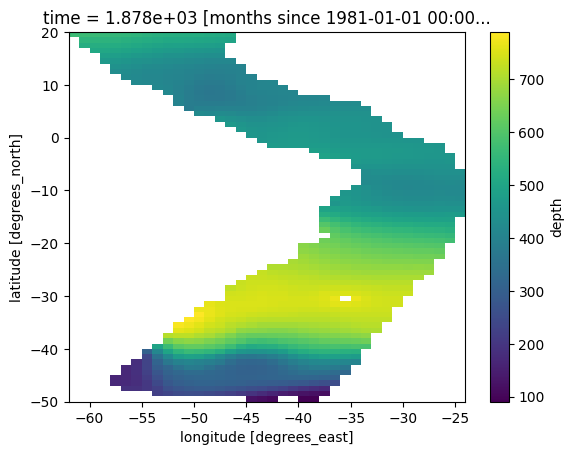

In [ ]:
import geopandas as gpd
import fiona
import regionmask
import xarray as xr # Import xarray

# Define the region of interest (approximately Brazil)
# Adjust these values as needed
lat_min = -60
lat_max = 20
lon_min = -70
lon_max = -10

# Slice the xarray for the region defined in pygmt
ds_subset = ds.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

# Ensure KML support
fiona.drvsupport.supported_drivers['KML'] = 'rw'

# Read areas
area1 = gpd.read_file('50S_20S.kml', driver="KML")
area2 = gpd.read_file('25S_20N.kml', driver="KML")

# Merge areas using union_all()
merged_geom = area1.union_all().union(area2.union_all())

# Create GeoDataFrame from the merged geometry
merged_area = gpd.GeoDataFrame(geometry=[merged_geom], crs=area1.crs)

# Convert the GeoDataFrame into a region mask object
mask = regionmask.mask_geopandas(merged_area, ds_subset['lon'], ds_subset['lat'])

# Apply the mask to the dataset
ds_area = ds_subset.where(mask == mask, drop=True)

# Plot the 'depth' variable from the dataset
ds_area.depth.plot()

Aviso: NaN encontrado, preenchendo com média
Valores da máscara: [ 0. nan]


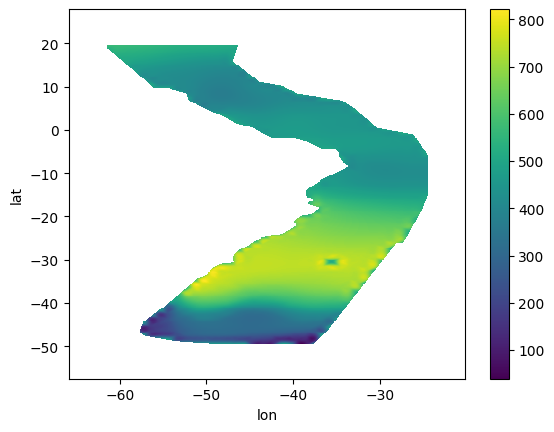

In [ ]:
import numpy as np
import regionmask
from scipy.interpolate import griddata
import xarray as xr

# Function to create an expanded grid
def criar_grade_extrapolada(da, area, n=400, pad=0.05):
    bounds = area.total_bounds
    min_lon, min_lat, max_lon, max_lat = bounds
    lon_pad = (max_lon - min_lon) * pad
    lat_pad = (max_lat - min_lat) * pad
    min_lon -= lon_pad
    max_lon += lon_pad
    min_lat -= lat_pad
    max_lat += lat_pad
    new_lon = np.linspace(min_lon, max_lon, n)
    new_lat = np.linspace(min_lat, max_lat, n)
    return new_lat, new_lon

# --- Merged Area ---
da = ds_area.isel(time=0).depth  # Using your dataset filtered by the merged_area
da = da.sortby('lat').sortby('lon')

# Filling NaNs if any
if np.any(np.isnan(da.values)):
    print("Warning: NaN found, filling with mean")
    da = da.fillna(da.mean())

# Create extrapolated grid for merged area
new_lat, new_lon = criar_grade_extrapolada(da, merged_area, n=400, pad=0.1)

# Prepare points and values for interpolation
points = np.array(list(zip(np.repeat(da.lat.values, len(da.lon)),
                           np.tile(da.lon.values, len(da.lat)))))
values = da.values.flatten()

# Create grid for interpolation
new_lon_grid, new_lat_grid = np.meshgrid(new_lon, new_lat)

# Cubic interpolation
interp_values = griddata(points, values, (new_lat_grid, new_lon_grid),
                          method='cubic', fill_value=np.nan)

# Create interpolated DataArray
da_interp = xr.DataArray(interp_values, dims=('lat', 'lon'),
                          coords={'lat': new_lat, 'lon': new_lon})

# Create mask for the merged area
mask_interp = regionmask.mask_geopandas(merged_area, da_interp.lon, da_interp.lat)
print("Mask values:", np.unique(mask_interp.values))

# Apply mask
da_interp = da_interp.where(~np.isnan(mask_interp))

# Plot
da_interp.plot()

## Step 2 - Plot with Pygmt


In [ ]:
import pygmt

# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="10m", region=[-70, -10, -60, 20])
globe = pygmt.datasets.load_earth_relief(resolution="01d")

gmtread [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
gmtread [NOTICE]: SRTM15 Earth Relief v2.7 at 10x10 arc minutes reduced by Gaussian Cartesian filtering (52.4 km fullwidth) [Tozer et al., 2019].
gmtread [NOTICE]:   -> Download grid file [3.0M]: earth_relief_10m_g.grd
gmtread [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
gmtread [NOTICE]: SRTM15 Earth Relief v2.7 at 1x1 arc degrees reduced by Gaussian Cartesian filtering (314.5 km fullwidth) [Tozer et al., 2019].
gmtread [NOTICE]:   -> Download grid file [112K]: earth_relief_01d_g.grd


In [ ]:
# define the reduction factor (e.g., reduce by half)
fator = 0.2

grid2 = grid.where(grid <= 0, grid * fator)   # apply factor to positive values
grid2 = grid2.where(grid2 >= -5500, -5500)    # everything below -5500 becomes -5500

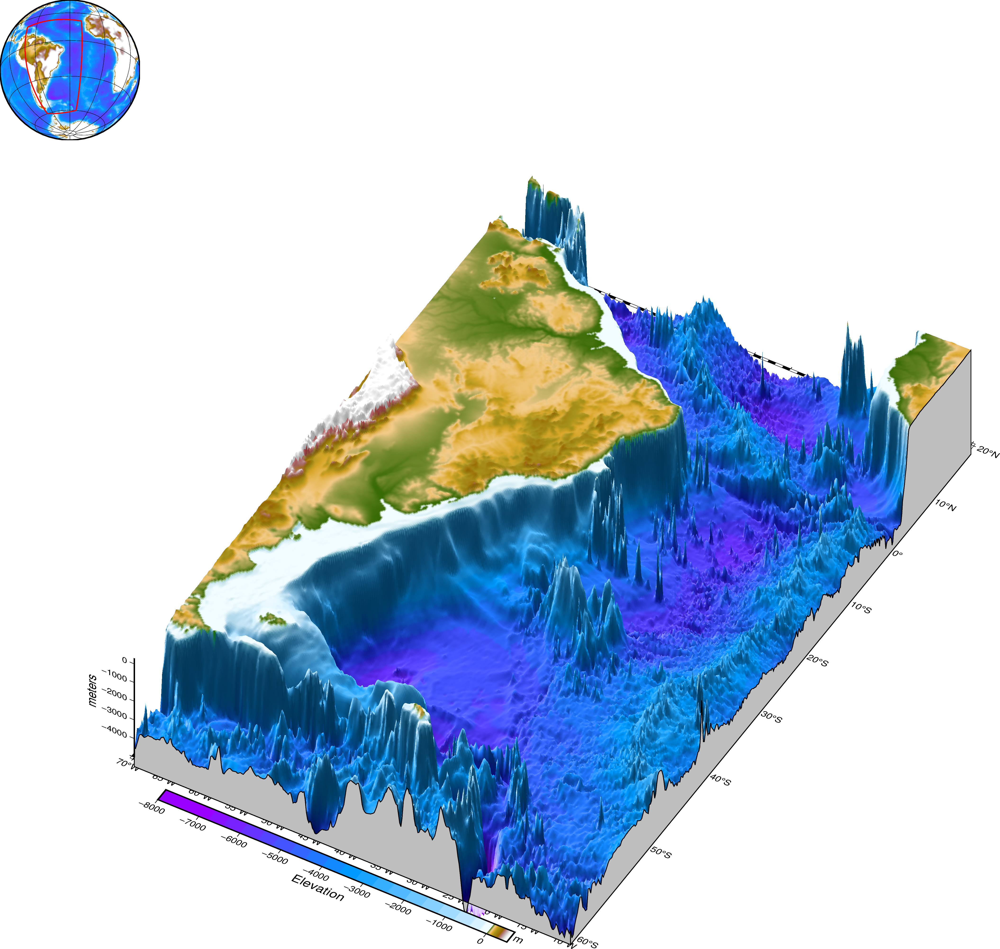

In [ ]:
# a little perspective
region=[-70, -10, -60, 20]
fig = pygmt.Figure()
# note I can add projection, after cmap and after, frame (and control frame)
topo_cpt = pygmt.makecpt(cmap='gmt/globe',series=f'-8000/500/50',continuous=True)
frame =  ["xa5f1","ya10f1", "z1000+lmeters", "wSEnZ"]

fig.grdview(grid=grid2,
            region=[-70, -10, -60, 20,-5000,300],
            frame=frame,
            perspective=[150,45],
            projection='M18c',
            zsize='5c',
            surftype='i', # check the surface type is "i" (of image)
            cmap=topo_cpt,
            plane="-5500+ggrey",
            shading='+d', # we are using the default shading
           )

fig.colorbar(perspective=True, frame=["a1000", "x+lElevation", "y+lm"])

bounds = [[-70.,-60.],
          [-70.,20.],
          [-20.,20.],
          [-20.,-60.],
          [-70.,-60.]]

with fig.inset(position="JTL+w5c+o-0.2c", margin=0, box=None): #"JTL+w3.5c+o0.2c"
    # Create a figure in the inset using the global projection centered at Olympus MOns
    fig.grdimage(grid=globe,region='g',frame='g',projection='G-30/-25/5c')
    fig.plot(bounds,pen="1p,red")

fig.show()

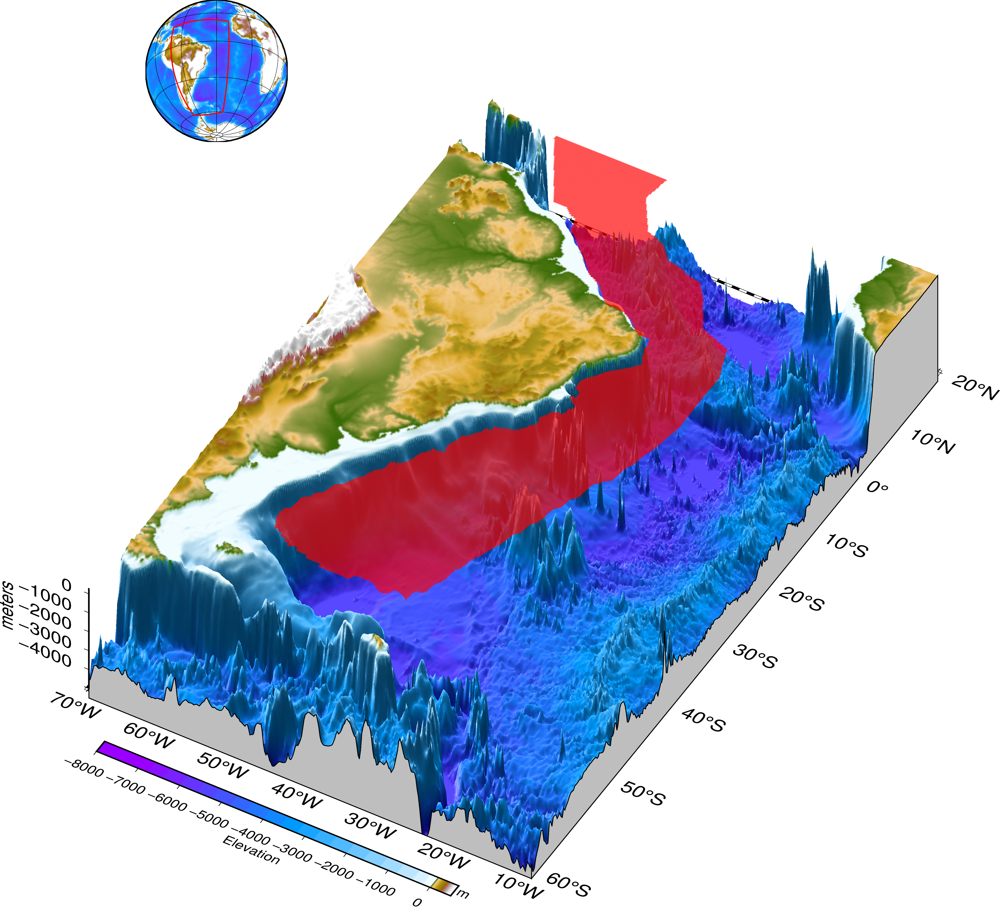

In [ ]:
import pygmt

region=[-70, -10, -60, 20, -5000, 300]

fig = pygmt.Figure()

# CPT
topo_cpt = pygmt.makecpt(cmap='gmt/globe',series=f'-8000/500/50',continuous=True)

with pygmt.config(FONT="22p", MAP_ANNOT_OFFSET_PRIMARY="0.5c"):  # this pushes ticks outwards
  # Main grid (topography/bathymetry)
  fig.grdview(
      grid=grid2,
      region=region,
      frame=["xa10f1", "ya10f1", "z1000+lmeters", "wSEnZ"],
      perspective=[150, 45],
      projection='M18c',
      zsize='5c',
      surftype='i',
      cmap=topo_cpt,
      plane="-5500+ggrey",
      shading='+d'
  )

# Colorbar
with pygmt.config(FONT="16p", MAP_ANNOT_OFFSET_PRIMARY="0.5c"):
  fig.colorbar(perspective=True, frame=["a1000", "x+lElevation", "y+lm"], position="JBC+o0/2c" )

bounds = [[-70.,-60.],
          [-70.,20.],
          [-20.,20.],
          [-20.,-60.],
          [-70.,-60.]]

with fig.inset(position="JTL+w5c+o-7c/-3c", margin=0, box=None): #"JTL+w3.5c+o0.2c"
    # Create a figure in the inset using the global projection centered at Olympus MOns
    fig.grdimage(grid=globe,region='g',frame='g',projection='G-30/-25/5c')
    fig.plot(bounds,pen="1p,red")

# Create a unique red CPT
red_cpt = pygmt.makecpt(cmap="255/0/0", series=[-5000, 0])  # Same color (red) for the range

# === Now plot your ds_area1 area ===
fig.grdview(
    grid=-da_interp,
    region=region,
    perspective=[150, 45],
    projection='M18c',
    zsize='5c',
    surftype='s',       # "s" = surface (a triangular mesh)
    cmap=red_cpt,     # can change the palette
    transparency=40     # semi-transparent to see the relief underneath
)

fig.show()